# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [10]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)


In [45]:
def showImageGray(ax, image):
    ax.axis('off')
    ax.imshow(image, 'gray', vmin=0, vmax=256)
#

def showImage(image, scalling=30, title=""):
    plt.figure(figsize=(image.shape[0]/scalling,image.shape[1]/scalling))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()
#

def showImageGrayPlt(image):
    plt.axis('off')
    # plt.imshow(image, 'gray', vmin=0, vmax=256)
    plt.imshow(image, 'gray')
#

def show3ImagesGray(image, imageKernel):
    _, axs = plt.subplots(1, 2, figsize=(16, 10))

    axs[0].imshow(image, cmap='gray')
    axs[1].imshow(imageKernel, cmap='gray')
    # axs[2].imshow(cv2.subtract(imageKernel, image), cmap='gray')

    axs[0].axis('off')
    axs[1].axis('off')
    # axs[2].axis('off')
#

In [12]:
boardImg = cv2.imread("plansza.png", cv2.IMREAD_GRAYSCALE)

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

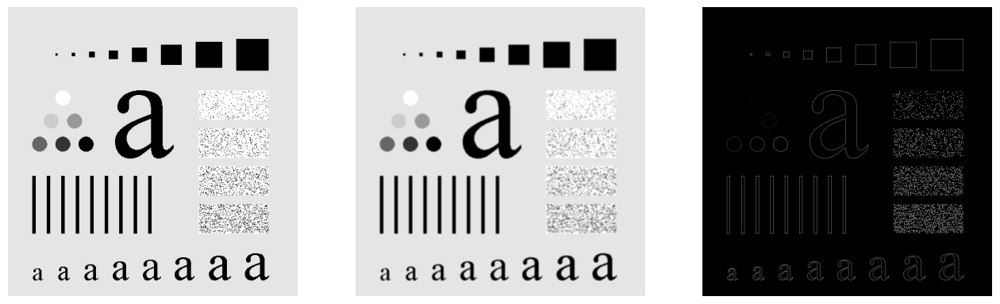

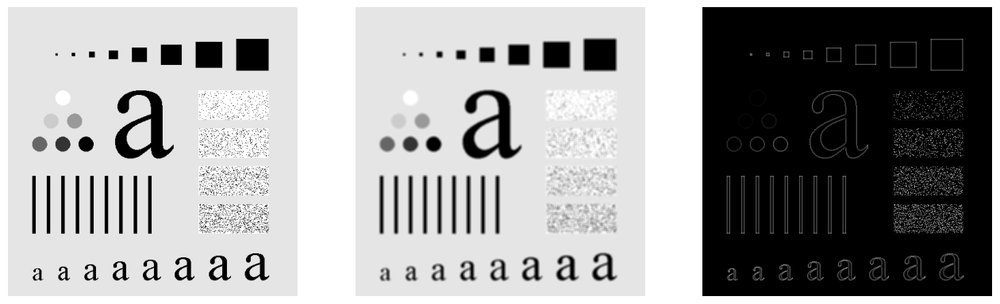

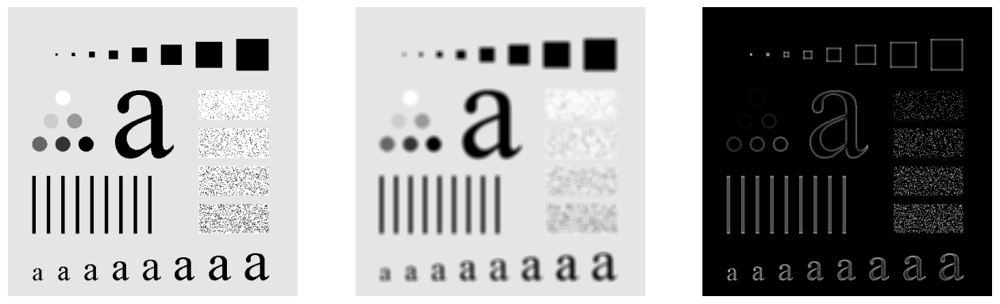

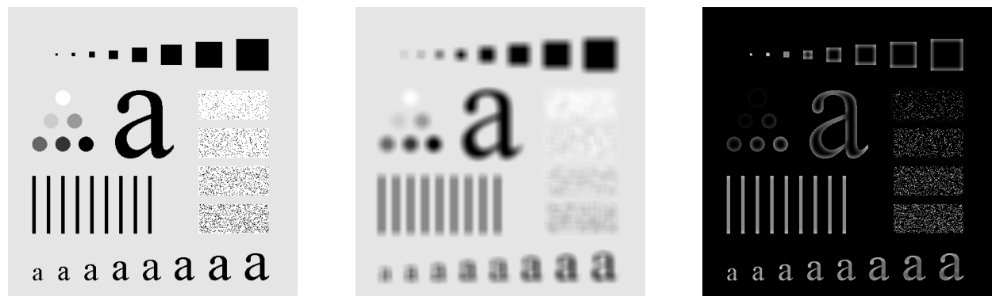

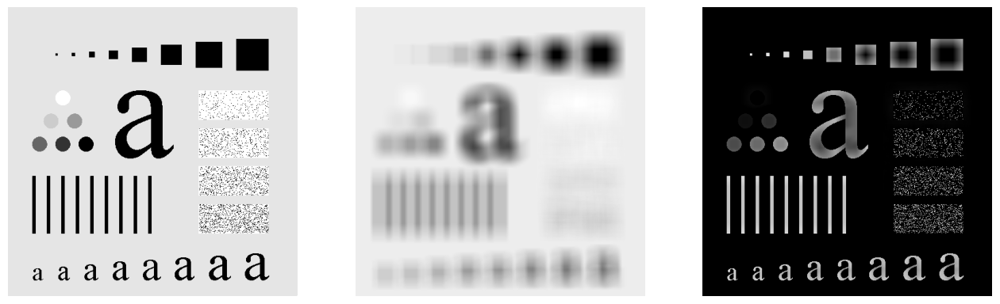

In [13]:
kernel = np.ones((3, 3)) / 9
boardKernel = cv2.filter2D(boardImg, -1, kernel)
show3ImagesGray(boardImg, boardKernel)

kernel = np.ones((5, 5)) / 25
boardKernel = cv2.filter2D(boardImg, -1, kernel)
show3ImagesGray(boardImg, boardKernel)

kernel = np.ones((9, 9)) / 81
boardKernel = cv2.filter2D(boardImg, -1, kernel)
show3ImagesGray(boardImg, boardKernel)

kernel = np.ones((15, 15)) / 225
boardKernel = cv2.filter2D(boardImg, -1, kernel)
show3ImagesGray(boardImg, boardKernel)

kernel = np.ones((35, 35)) / 1225
boardKernel = cv2.filter2D(boardImg, -1, kernel)
show3ImagesGray(boardImg, boardKernel)

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

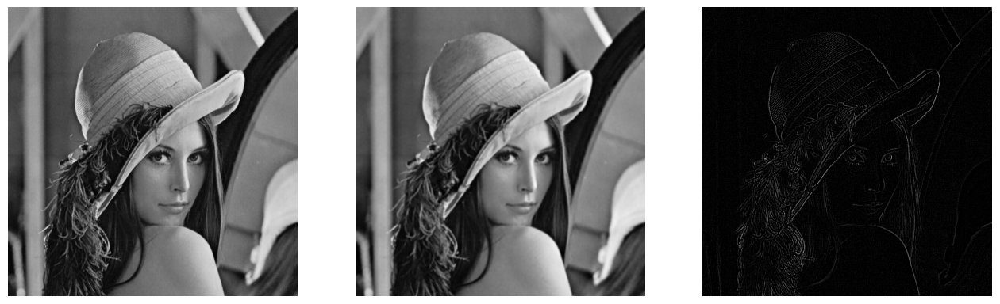

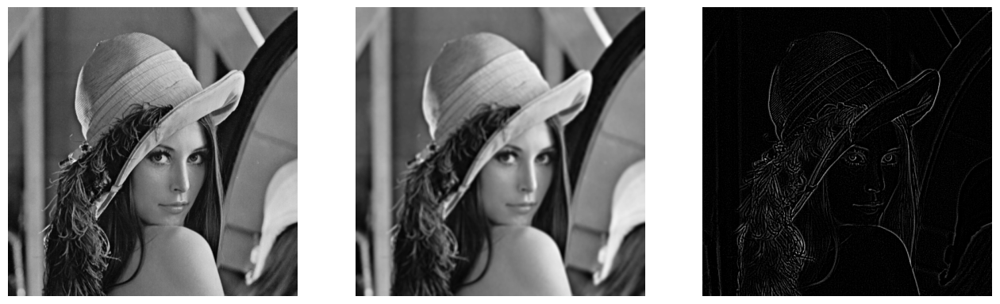

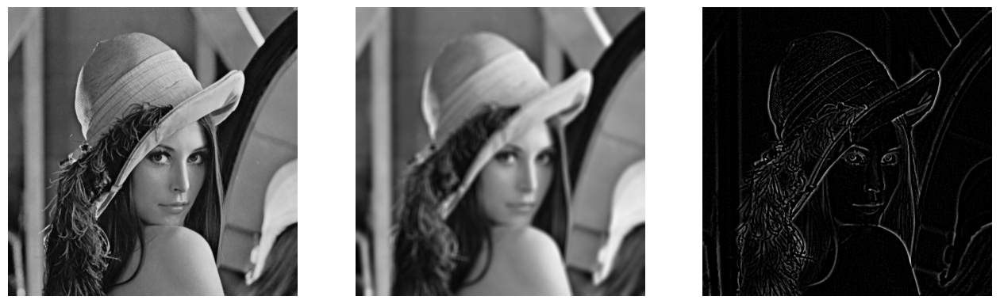

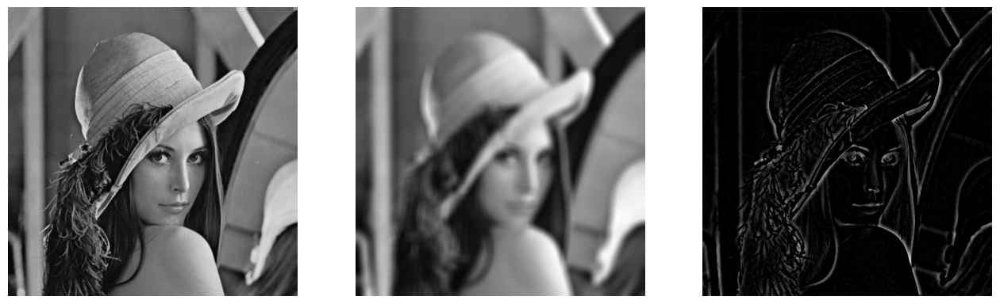

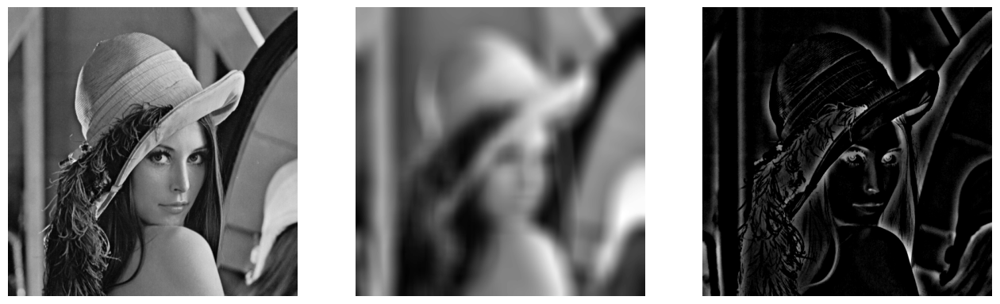

In [14]:
lenaImg = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)

kernel = np.ones((3, 3)) / 9
lenaKernel = cv2.filter2D(lenaImg, -1, kernel)
show3ImagesGray(lenaImg, lenaKernel)

kernel = np.ones((5, 5)) / 25
lenaKernel = cv2.filter2D(lenaImg, -1, kernel)
show3ImagesGray(lenaImg, lenaKernel)

kernel = np.ones((9, 9)) / 81
lenaKernel = cv2.filter2D(lenaImg, -1, kernel)
show3ImagesGray(lenaImg, lenaKernel)

kernel = np.ones((15, 15)) / 225
lenaKernel = cv2.filter2D(lenaImg, -1, kernel)
show3ImagesGray(lenaImg, lenaKernel)

kernel = np.ones((35, 35)) / 1225
lenaKernel = cv2.filter2D(lenaImg, -1, kernel)
show3ImagesGray(lenaImg, lenaKernel)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

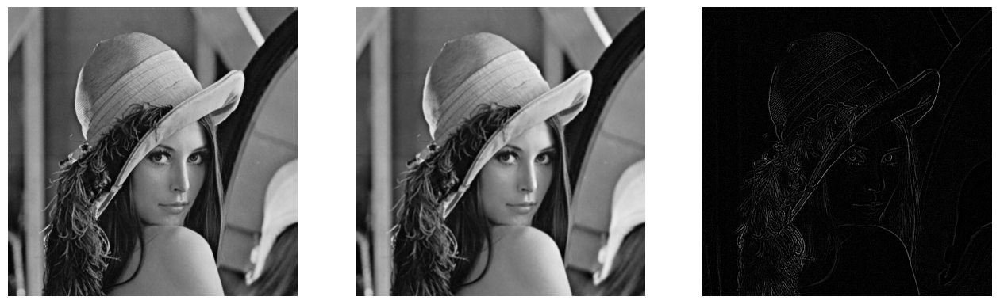

In [15]:
mask = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
mask = mask / sum(sum(mask))

lenaMask = cv2.filter2D(lenaImg, -1, mask)
show3ImagesGray(lenaImg, lenaMask)

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


In [16]:
def fgaussian(size, sigma):
    m = n = size
    h, k = m//2, n//2
    x, y = np.mgrid[-h:h+1, -k:k+1]
    g = np.exp(-(x**2 + y**2)/(2*sigma**2))
    return g /g.sum() 
    
    
def mesh(fun, size):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    
    plt.show()
#

In [17]:
# mesh(fgaussian(5, 0.5), 5)
# mesh(fgaussian(5, 1), 5)
# mesh(fgaussian(5, 2), 5)

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


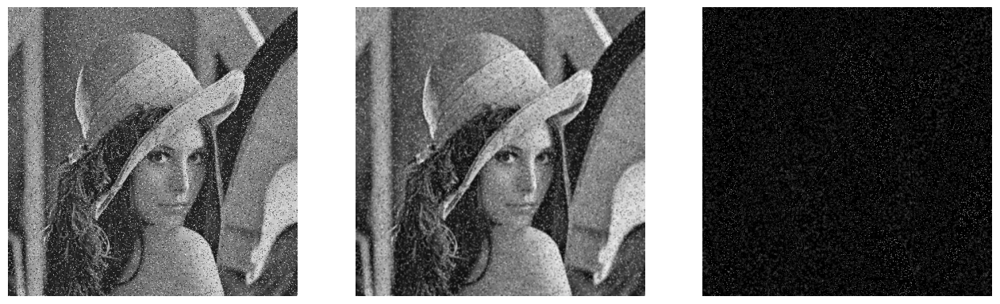

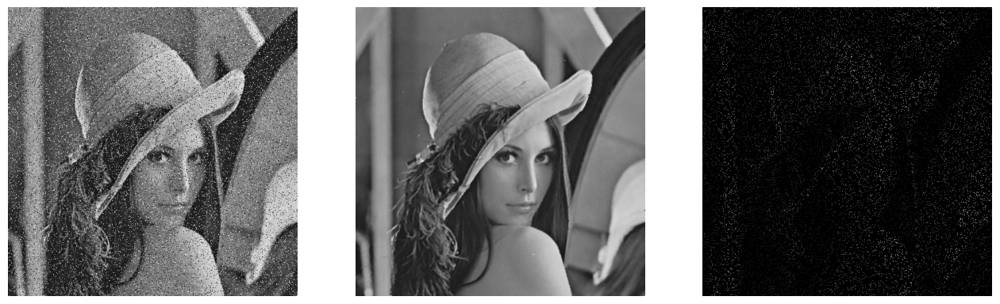

In [18]:
lenaImg = cv2.imread('lenaSzum.png', cv2.IMREAD_GRAYSCALE)

mask = np.ones((3,3)) / 9
lenaMask = cv2.filter2D(lenaImg, -1, mask)
show3ImagesGray(lenaImg, lenaMask)

lenaMask = cv2.medianBlur(lenaImg, 3)
show3ImagesGray(lenaImg, lenaMask)

2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

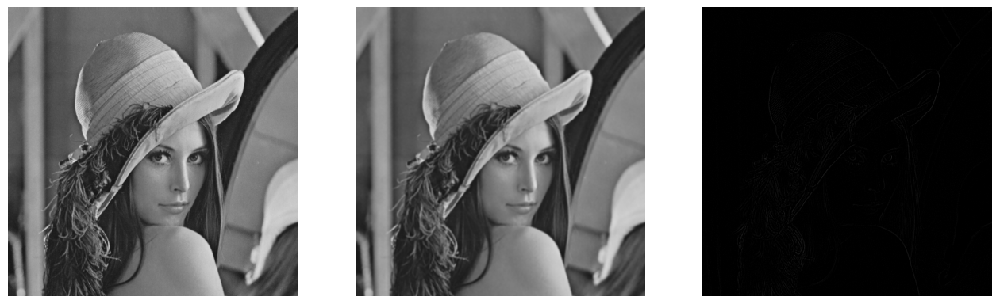

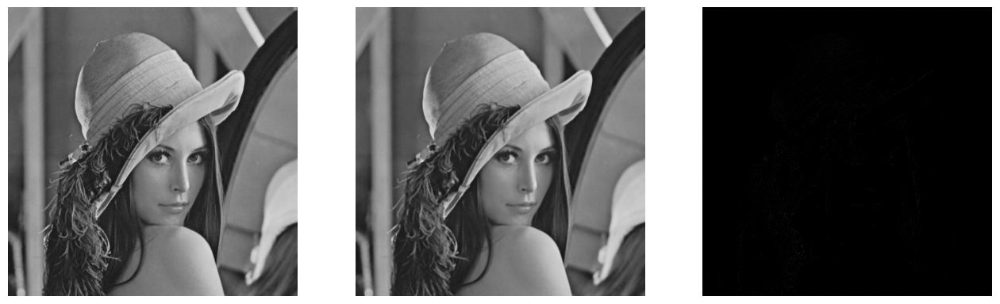

In [19]:
lenaImg = cv2.imread('lena.png')

mask = np.ones((3,3)) / 9
lenaMask = cv2.filter2D(lenaImg, -1, mask)
show3ImagesGray(lenaImg, lenaMask)

lenaMask = cv2.medianBlur(lenaImg, 3)
show3ImagesGray(lenaImg, lenaMask)

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

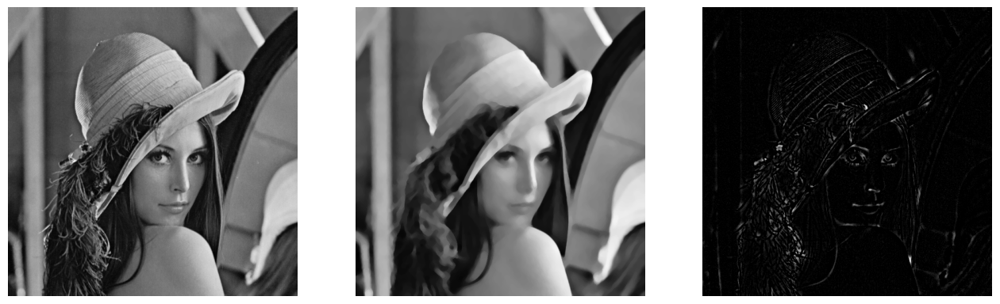

In [20]:
lenaImg = cv2.imread('lena.png', cv2.IMREAD_GRAYSCALE)

LOOP = 10
mask = np.ones((5,5)) / 25 
lenaMask = cv2.medianBlur(lenaImg, 5)

for a in range(LOOP - 1):
    lenaMask = cv2.medianBlur(lenaMask, 5)

show3ImagesGray(lenaImg, lenaMask)

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

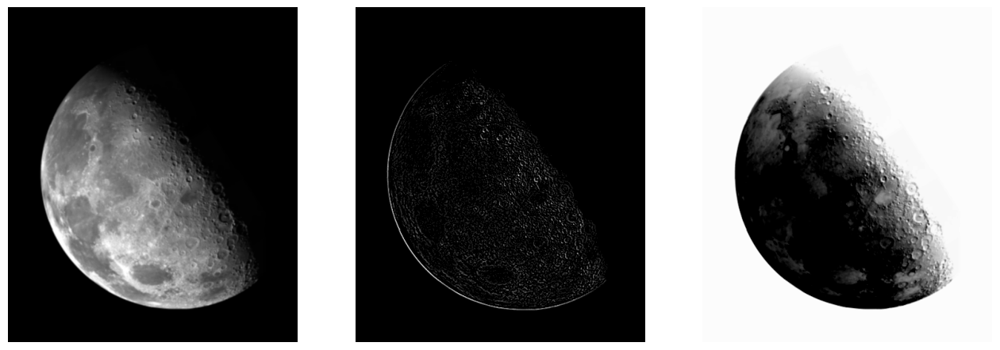

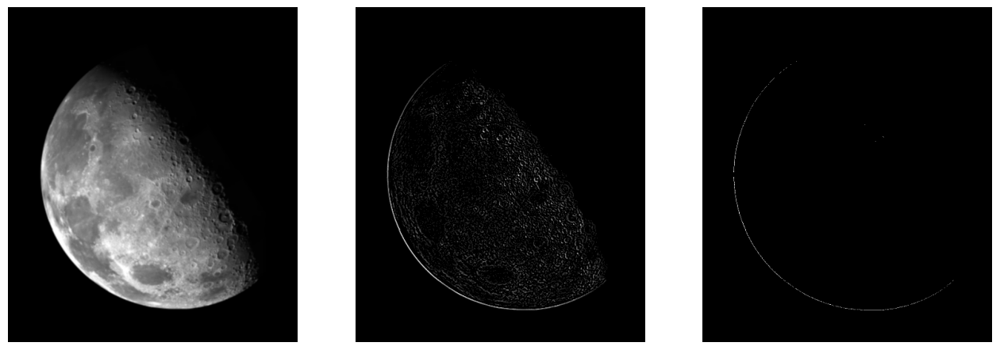

In [21]:
moon = cv2.imread('moon.png', cv2.IMREAD_GRAYSCALE)

mask = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
mask = mask / 9 

moonMask = cv2.filter2D(moon, -1, mask)
show3ImagesGray(moon, moonMask + 128)

moonMask = cv2.filter2D(moon, -1, mask)
show3ImagesGray(moon, np.abs(moonMask))

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



(-0.5, 465.5, 539.5, -0.5)

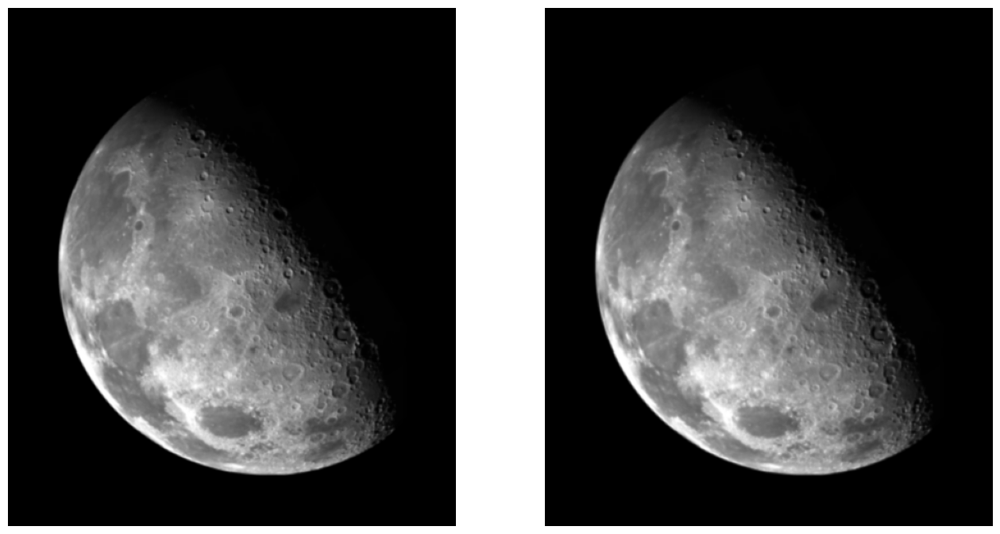

In [22]:
_, axs = plt.subplots(1, 2, figsize=(16, 10))
axs[0].imshow(moon, cmap='gray')
axs[1].imshow(moonMask + moon.astype(np.int32), cmap='gray')

axs[0].axis('off')
axs[1].axis('off')

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

In [23]:
kw = cv2.imread('kw.png', cv2.IMREAD_GRAYSCALE)

In [24]:
R1 = np.array([[ 0, 0, 0],
               [-1, 0, 0],
               [ 0, 1, 0]])
R2 = np.array([[ 0, 0,  0],
               [ 0, 0, -1],
               [ 0, 1,  0]])

P1 = np.array([[-1, 0, 0],
               [-1, 0, 0],
               [-1, 1, 0]])
P2 = np.array([[-1, -1, -1],
               [ 0,  0,  0],
               [ 1,  1,  1]])

S1 = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]])
S2 = np.array([[-1, -2, -1],
               [ 0,  0,  0],
               [ 1,  2,  1]])

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\core\src\arithm.cpp:685: error: (-5:Bad argument) When the input arrays in add/subtract/multiply/divide functions have different types, the output array type must be explicitly specified in function 'cv::arithm_op'


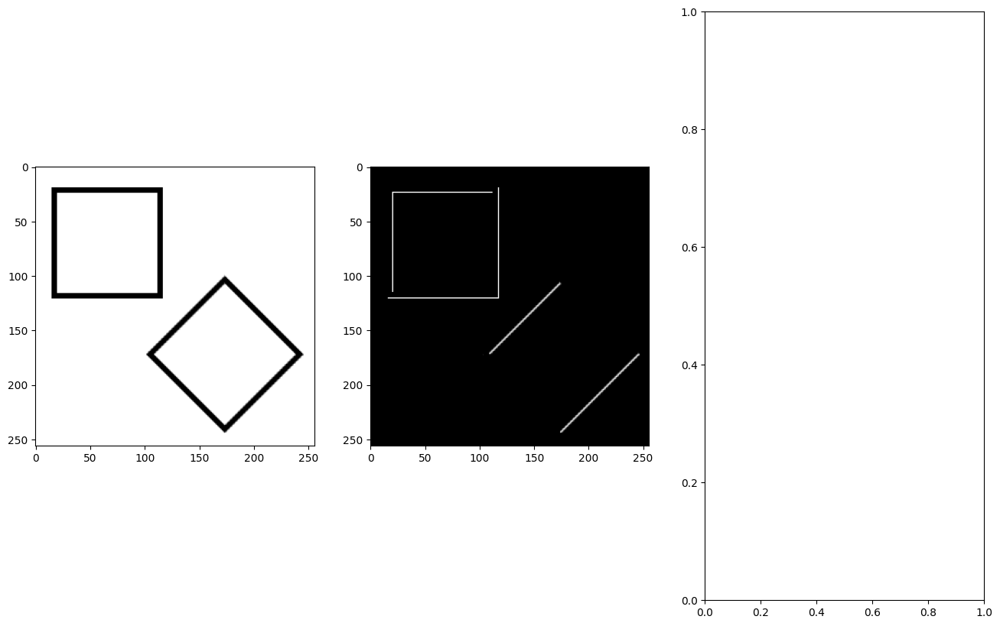

In [42]:
kwMask = cv2.filter2D(kw.astype(np.uint8), -1, R1)
show3ImagesGray(kw, kwMask.astype(np.int16) + 128)
show3ImagesGray(kw, np.abs(kwMask))

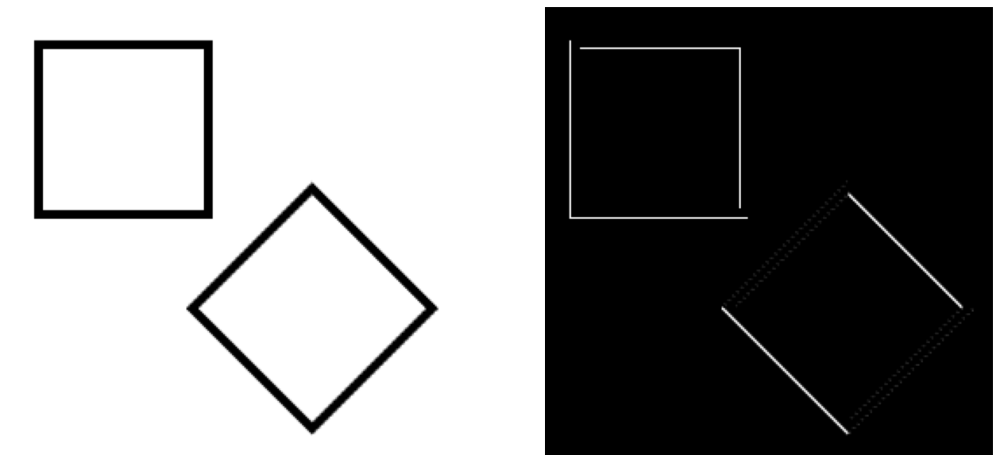

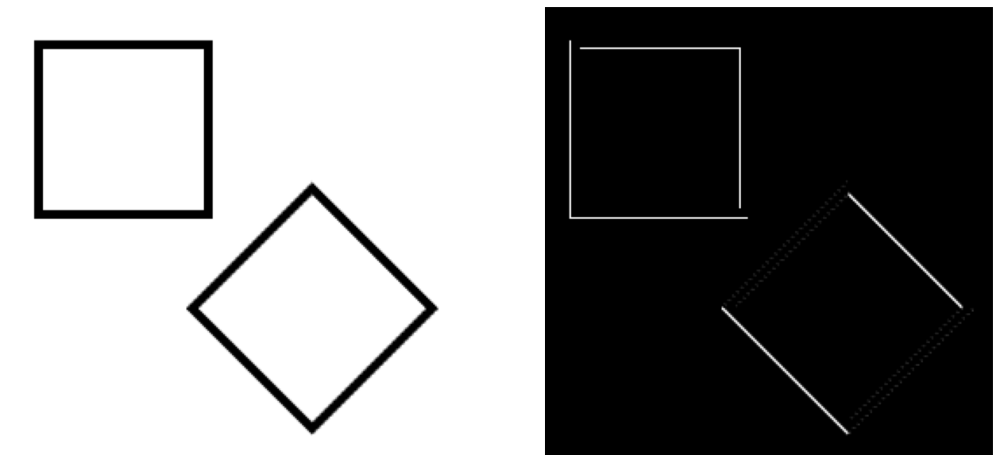

In [47]:
kwMask = cv2.filter2D(kw, -1, R2)
show3ImagesGray(kw, kwMask.astype(np.int32)+ 128)
show3ImagesGray(kw, np.abs(kwMask))

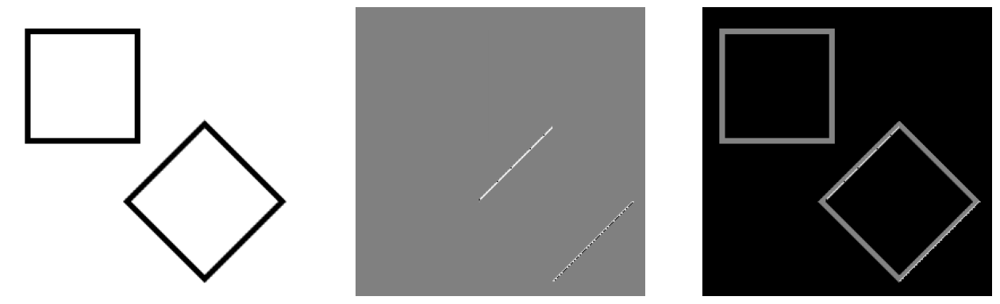

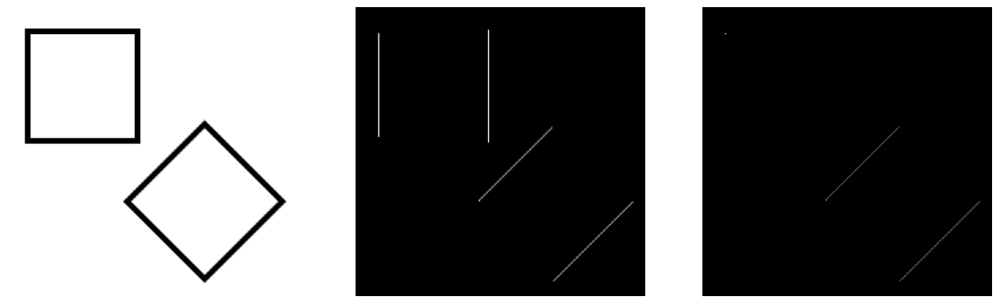

In [27]:
kwMask = cv2.filter2D(kw, -1, P1)
show3ImagesGray(kw, kwMask + 128)
show3ImagesGray(kw, np.abs(kwMask))

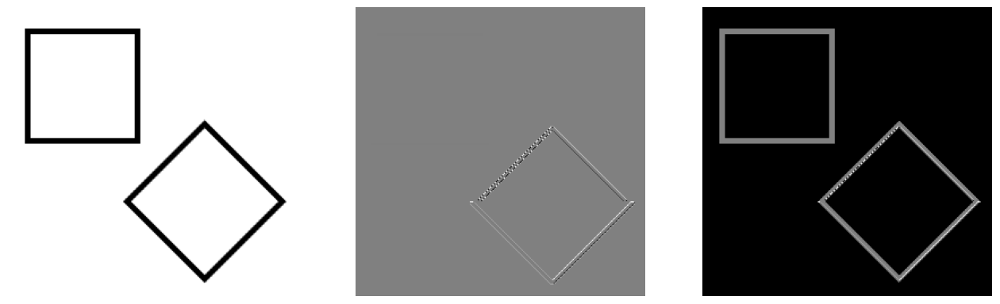

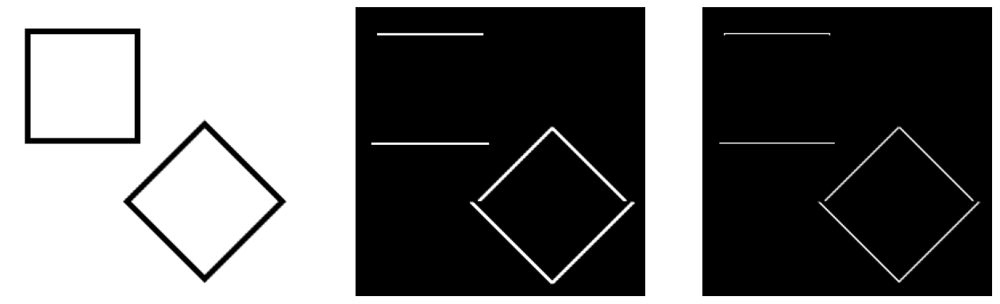

In [28]:
kwMask = cv2.filter2D(kw, -1, P2)
show3ImagesGray(kw, kwMask + 128)
show3ImagesGray(kw, np.abs(kwMask))

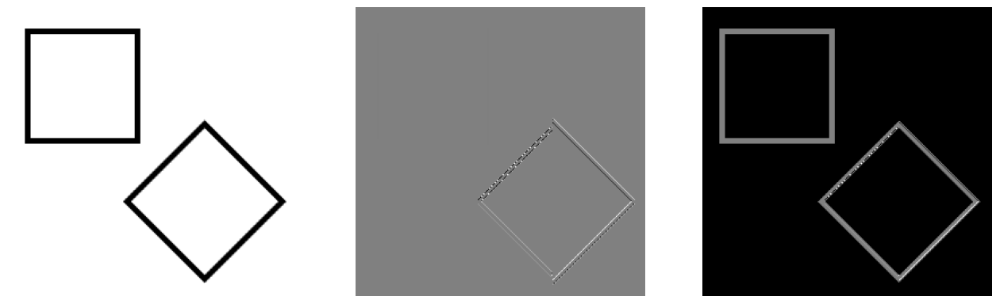

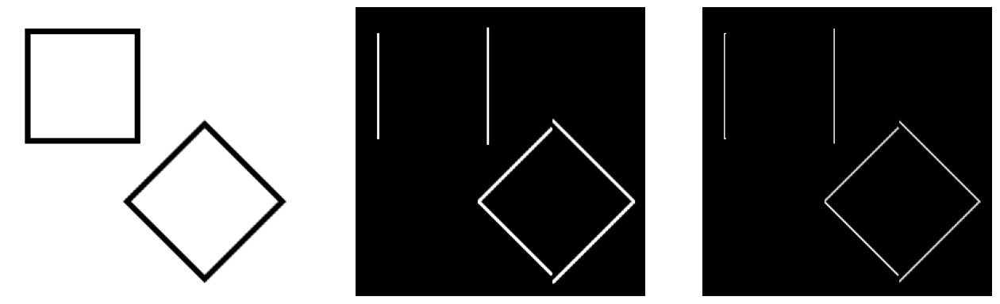

In [29]:
kwMask = cv2.filter2D(kw, -1, S1)
show3ImagesGray(kw, kwMask + 128)
show3ImagesGray(kw, np.abs(kwMask))

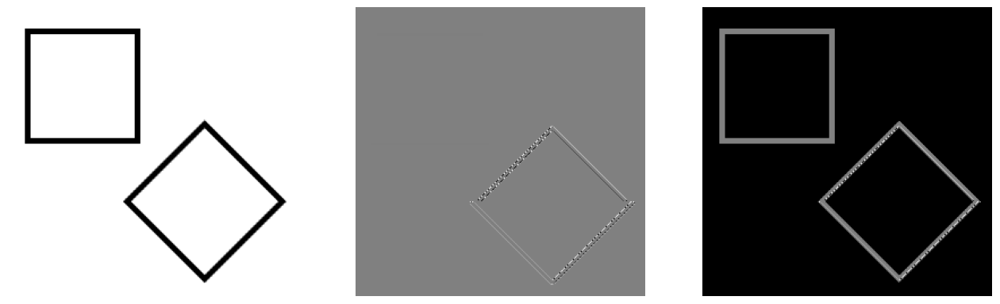

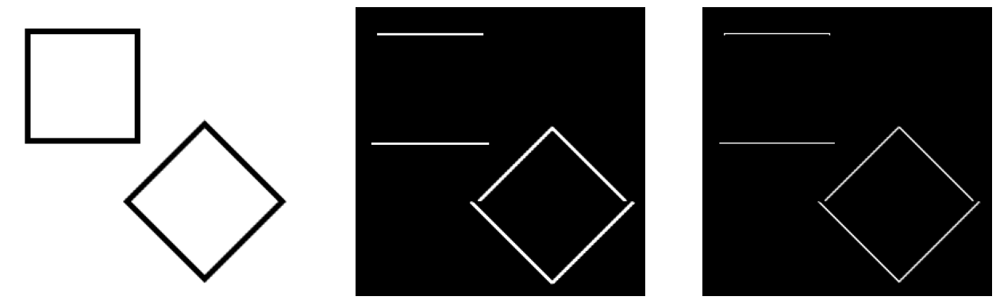

In [30]:
kwMask = cv2.filter2D(kw, -1, S2)
show3ImagesGray(kw, kwMask + 128)
show3ImagesGray(kw, np.abs(kwMask))

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



(-0.5, 255.5, 255.5, -0.5)

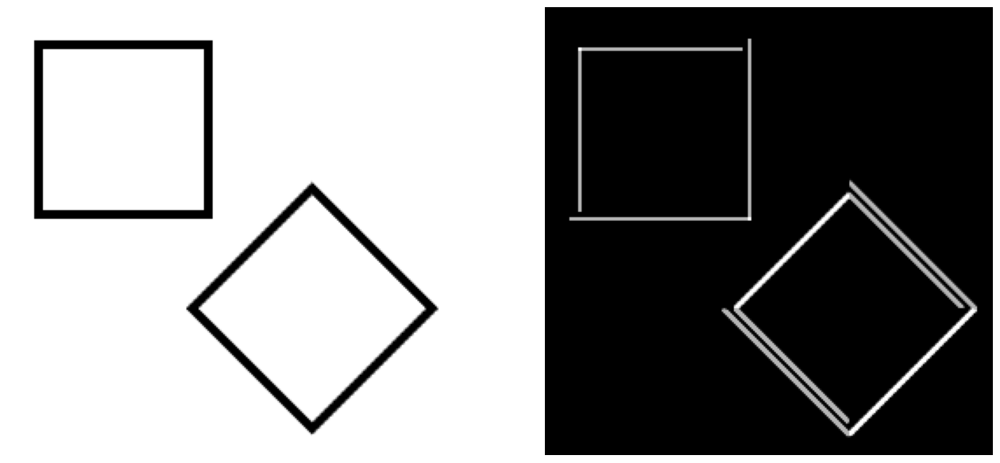

In [31]:
kwMaskS1 = cv2.filter2D(kw, -1, S1).astype(np.int32)
kwMaskS2 = cv2.filter2D(kw, -1, S2).astype(np.int32)
kwMask = np.sqrt( np.square(kwMaskS1) + np.square(kwMaskS2) )

_, axs = plt.subplots(1, 2, figsize=(16, 10))
axs[0].imshow(kw, cmap='gray')
axs[1].imshow(kwMask, cmap='gray')

axs[0].axis('off')
axs[1].axis('off')

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

(-0.5, 255.5, 255.5, -0.5)

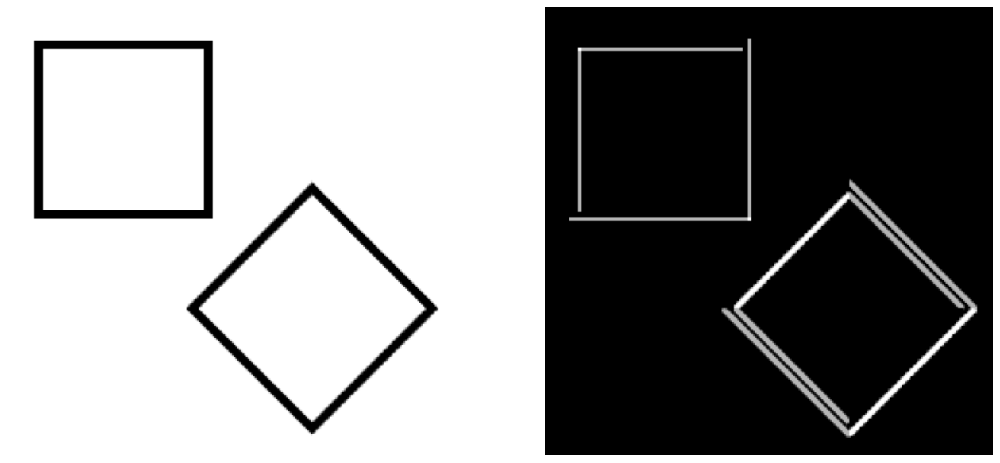

In [32]:
kwMaskS1 = cv2.filter2D(kw, -1, S1).astype(np.int32)
kwMaskS2 = cv2.filter2D(kw, -1, S2).astype(np.int32)
kwMask = np.sqrt( np.abs(kwMaskS1) + np.abs(kwMaskS2) )

_, axs = plt.subplots(1, 2, figsize=(16, 10))
axs[0].imshow(kw, cmap='gray')
axs[1].imshow(kwMask, cmap='gray')

axs[0].axis('off')
axs[1].axis('off')

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

In [33]:
jet = cv2.imread('jet.png', cv2.IMREAD_GRAYSCALE)

(-0.5, 511.5, 511.5, -0.5)

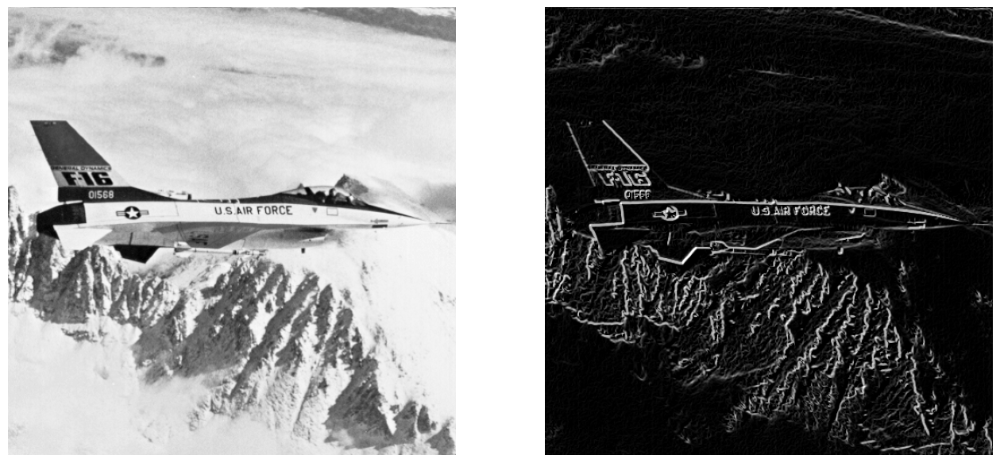

In [34]:
jetMaskS1 = cv2.filter2D(jet, -1, S1).astype(np.int32)
jetMaskS2 = cv2.filter2D(jet, -1, S2).astype(np.int32)
jetMask = np.sqrt( np.square(jetMaskS1) + np.square(jetMaskS2) )

_, axs = plt.subplots(1, 2, figsize=(16, 10))
axs[0].imshow(jet, cmap='gray')
axs[1].imshow(jetMask, cmap='gray')

axs[0].axis('off')
axs[1].axis('off')

(-0.5, 511.5, 511.5, -0.5)

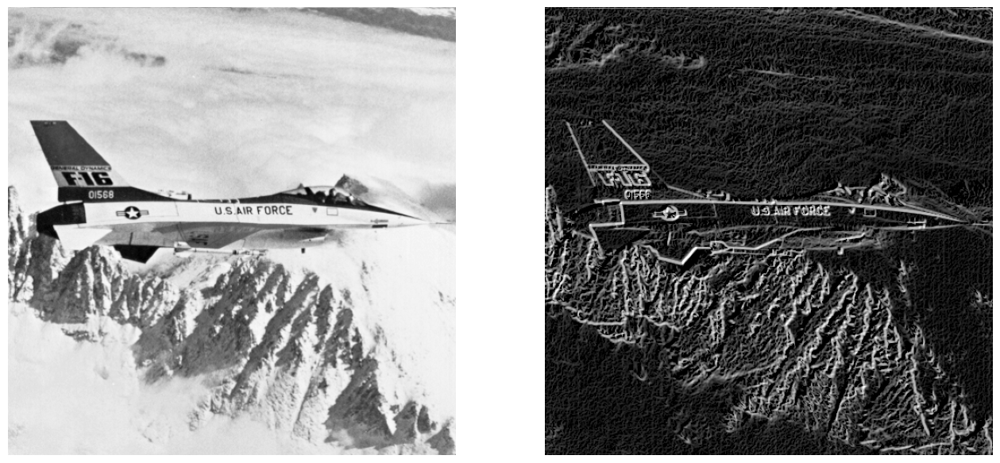

In [35]:
jetMaskS1 = cv2.filter2D(jet, -1, S1).astype(np.int32)
jetMaskS2 = cv2.filter2D(jet, -1, S2).astype(np.int32)
jetMask = np.sqrt( np.abs(jetMaskS1) + np.abs(jetMaskS2) )

_, axs = plt.subplots(1, 2, figsize=(16, 10))
axs[0].imshow(jet, cmap='gray')
axs[1].imshow(jetMask, cmap='gray')

axs[0].axis('off')
axs[1].axis('off')